# Recipes Web App - Clustering Part

In this notebook you can find the code that we implemented to perform clustering of the given recipes. Comments are provided regularly, so the whole procedure and code functionality is fully understood at every step. The notebook comprisses of the following parts:

- *Data Preprocessing*
- *Data Vectorization*
- *Dimensionality Reduction (t-SNE)*
- *Find optimal number of clusters*
- *Clustering (K-Means)*
- *Visualization*
    

# Import libraries

In [1]:
import pandas as pd
from numpy.random import RandomState
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import nltk
from nltk.stem.snowball import SnowballStemmer, PorterStemmer
from Parse_Data import ParseData

pd.options.display.max_colwidth = 300

In [2]:
os.listdir()

['.ipynb_checkpoints',
 'data',
 'Group Project_Clustering_MVP_Deliverable.ipynb',
 'Main_Prog.py',
 'NotToCommit',
 'Parse_Data.py',
 '__pycache__']

# Load data

In [3]:
# Load data
filepath = "C:/Users/asfak/OneDrive/Documents/Github_Repositories/COMPGC27 Programming for BA - Group Project"
         
df_initial = ParseData(filepath)

1000 files processed so far
2000 files processed so far
3000 files processed so far
4000 files processed so far
5000 files processed so far
6000 files processed so far
7000 files processed so far
8000 files processed so far
9000 files processed so far
10000 files processed so far
11000 files processed so far
12000 files processed so far
13000 files processed so far
14000 files processed so far
15000 files processed so far
16000 files processed so far
17000 files processed so far
18000 files processed so far
19000 files processed so far
20000 files processed so far
21000 files processed so far
22000 files processed so far
23000 files processed so far
24000 files processed so far
25000 files processed so far
26000 files processed so far
27000 files processed so far


In [4]:
df_initial.columns

Index(['Name', 'Picture', 'Course', 'Cuisine', 'Ingredients', 'Flavors',
       'kcal', 'Nutrients', 'kcal_dict', 'PreparationTime', 'TotalTime'],
      dtype='object')

In [5]:
df_initial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27638 entries, 0 to 27637
Data columns (total 11 columns):
Name               27638 non-null object
Picture            27638 non-null object
Course             27638 non-null object
Cuisine            27638 non-null object
Ingredients        27638 non-null object
Flavors            27638 non-null object
kcal               27638 non-null float64
Nutrients          27638 non-null object
kcal_dict          27638 non-null object
PreparationTime    27638 non-null object
TotalTime          23854 non-null float64
dtypes: float64(2), object(9)
memory usage: 2.3+ MB


In [6]:
df_initial["Course"].value_counts()

Main Dishes              13665
Desserts                  3204
Salads                    2406
Side Dishes               2147
Soups                     1804
Appetizers                1513
Condiments and Sauces      830
Lunch and Snacks           649
Breakfast and Brunch       587
Breads                     467
Beverages                  250
Cocktails                   99
Afternoon Tea               17
Name: Course, dtype: int64

In [7]:
df_initial["Cuisine"].value_counts()

American                11729
Italian                  4571
Mexican                  3394
Asian                    1951
French                   1562
Indian                   1457
Kid-Friendly              962
Southwestern              600
Thai                      347
Barbecue                  338
Chinese                   266
Southern & Soul Food      151
Greek                      80
Mediterranean              72
Spanish                    58
Cuban                      31
Cajun & Creole             18
Moroccan                   11
Japanese                   10
Irish                       9
English                     6
Hawaiian                    5
German                      4
Hungarian                   3
Portuguese                  2
Vietnamese                  1
Name: Cuisine, dtype: int64

In [8]:
df_initial["Flavors"][10]

{'Bitter': 0.1667,
 'Meaty': 0.1667,
 'Piquant': 0.3333,
 'Salty': 0.1667,
 'Sour': 0.5,
 'Sweet': 0.6667}

In [9]:
df_initial["Ingredients"][0]

'2 cups Baby Bella mushrooms, sliced2 cups arborio rice1 tsp olive oil3 tsp butter2 shallots, minced1 cup white wine8 cups fat free chicken stock (or vegetable stock)salt and peppersalt and pepper1/2 cup grated parmesan cheese4 tbsp chopped parsley'

### Add picture title

In [10]:
img_filepath = r"C:\Users\asfak\OneDrive\Documents\Github_Repositories\COMPGC27 Programming for BA - Group Project\data\images27638"

In [11]:
img_titles = pd.Series(os.listdir(img_filepath))

In [12]:
df_initial["Image_Title"] = img_titles

In [13]:
df_initial.head()

,Name,Picture,Course,Cuisine,Ingredients,Flavors,kcal,Nutrients,kcal_dict,PreparationTime,TotalTime,Image_Title
0,Mushroom Risotto,img00001.jpg,Side Dishes,Italian,"2 cups Baby Bella mushrooms, sliced2 cups arborio rice1 tsp olive oil3 tsp butter2 shallots, minced1 cup white wine8 cups fat free chicken stock (or vegetable stock)salt and peppersalt and pepper1/2 cup grated parmesan cheese4 tbsp chopped parsley",{},4249.93,"Fatty acids, total polyunsaturated--Campesterol--Folate, DFE--Folate, food--Manganese, Mn--Vitamin E (alpha-tocopherol)--Fatty acids, total monounsaturated--Vitamin C, total ascorbic acid--Carotene, beta--Vitamin B-12--Folate, total--Glucose (dextrose)--Cholesterol--Methionine--Leucine--Folic ac...","{None: 80.0, 'Fatty acids, total polyunsaturated': 0.24, 'Campesterol': 0.0, 'Folate, DFE': 298.07, 'Folate, food': 0.0, 'Manganese, Mn': 0.0, 'Vitamin E (alpha-tocopherol)': 0.0, 'Fatty acids, total monounsaturated': 4.79, 'Vitamin C, total ascorbic acid': 0.01, 'Carotene, beta': 0.0, 'Vitamin ...",0,1800.0,img00001.jpg
1,Filipino BBQ Pork Skewers,img00002.jpg,Main Dishes,Barbecue,"2.5 lb pork country style ribs, all fat trimmed, cut into 1"" x 1"" cubes6 oz 7-up1/2 cup soy sauce1/2 cup white vinegar1 lemon, juice of1/3 cup brown sugar6 cloves garlic, crushed1 tsp black peppercrushed red pepper flakes (optional)","{'Piquant': 0.5, 'Sour': 0.5, 'Salty': 0.8333, 'Sweet': 0.3333, 'Bitter': 0.8333, 'Meaty': 0.8333}",6607.38,"Potassium, K--Fluoride, F--Phytosterols--Valine--18:1 c--18:2 n-6 c,c--Fatty acids, total saturated--Folate, DFE--Manganese, Mn--Glucose (dextrose)--Arginine--Alanine--Folate, food--Tyrosine--Iron, Fe--Energy--Vitamin B-6--Histidine--Aspartic acid--Fructose--Vitamin E (alpha-tocopherol)--Water--...","{None: 320.0, 'Potassium, K': 1.15, 'Fluoride, F': 0.0, 'Phytosterols': 0.01, 'Valine': 2.83, '18:1 c': 14.17, '18:2 n-6 c,c': 2.83, 'Fatty acids, total saturated': 5.83, 'Folate, DFE': 10.06, 'Manganese, Mn': 0.0, 'Glucose (dextrose)': 1.4, 'Arginine': 2.88, 'Alanine': 2.83, 'Folate, food': 0.0...",0,2400.0,img00002.jpg
2,Mushroom and Roasted Garlic Risotto,img00003.jpg,Main Dishes,Italian,"2 whole garlic heads2 tablespoons plus 2 teaspoons extra-virgin olive oil, divided1/2 cup plus 2 tablespoons Madeira, divided5 cups unsalted chicken stock, divided1/2 cup dried porcini mushrooms (1/2 ounce)1 3/4 cups chopped onion3 cups thinly sliced cremini mushrooms (about 8 ounces)2 1/2 cups ...","{'Sweet': 0.3333, 'Sour': 0.8333, 'Salty': 0.3333, 'Piquant': 0.0, 'Bitter': 1.0, 'Meaty': 0.5}",20519.24,"Fatty acids, total polyunsaturated--Folate, DFE--Folate, food--Manganese, Mn--Vitamin E (alpha-tocopherol)--Fatty acids, total monounsaturated--Vitamin C, total ascorbic acid--Carotene, beta--Vitamin B-12--Folate, total--Glucose (dextrose)--Cholesterol--Methionine--Leucine--Folic acid--Threonine...","{None: 540.0, 'Fatty acids, total polyunsaturated': 3.54, 'Folate, DFE': 1408.23, 'Folate, food': 0.0, 'Manganese, Mn': 0.01, 'Vitamin E (alpha-tocopherol)': 0.0, 'Fatty acids, total monounsaturated': 36.25, 'Vitamin C, total ascorbic acid': 0.1, 'Carotene, beta': 0.0, 'Vitamin B-12': 0.0, 'Fola...",0,5100.0,img00003.jpg
3,Gratin Dauphinois (Scalloped Potatoes with Cheese),img00004.jpg,Side Dishes,French,"1 garlic clove, halvedCooking spray6 peeled red potatoes, cut into 1/8-inch slices (about 2 pounds)2 tablespoons butter, melted1/2 teaspoon salt1/8 teaspoon black pepper1/2 cup (2 ounces) shredded Gruyère cheese1 cup fat-free milk","{'Sweet': 0.1667, 'Sour': 0.6667, 'Salty': 0.8333, 'Piquant': 0.3333, 'Bitter': 0.6667, 'Meaty': 0.3333}",1722.54,"Fatty acids, total polyunsaturated--Folate, DFE--Folate, food--Manganese, Mn--Vitamin E (alpha-tocopherol)--Fatty acids, total monounsaturated--Vitamin C, total ascorbic acid--Carotene, beta--Vitamin B-12--Folate, total--Cholesterol--Methionine--Leucine--Threonine--Niacin--Aspartic acid--Tocophe...","{None: 50.0, 'Fatty acids, total polyunsaturated': 0.31, 'Folate, DFE': 2

### Randomly choose a subset

Because the whole dataset is quite large, we decided to choose and deal with a subset of the dataset. One of the main reasons for this choice, was that at the dimensionality reduction part (see below), the calculations needed for 27k recipes required way more powerful machine and resources than the available ones.

In [14]:
number_of_recipes = 5000

# Set seed in an integer value, so every time you get the same random combination.
a = RandomState(33234)
ind = a.randint(0, df_initial.shape[0], number_of_recipes)
df = df_initial.iloc[ind,:]

In [15]:
df = df.reset_index(drop = True)

In [16]:
df.head()

,Name,Picture,Course,Cuisine,Ingredients,Flavors,kcal,Nutrients,kcal_dict,PreparationTime,TotalTime,Image_Title
0,Massaman Vegetable Curry With Tofu,img26709.jpg,Main Dishes,Indian,"2 tablespoons coconut oil or organic canola oil¼ teaspoon turmeric1 tablespoon cumin seeds1 large onion, sliced5 garlic cloves, minced2-inch knob ginger, peeled and grated/minced½ teaspoon ground cinnamon½ teaspoon ground cardamom¼ teaspoon ground cloves¼-1/2 teaspoon cayenne pepper¾ teaspoon se...","{'Piquant': 0.1667, 'Sour': 0.6667, 'Salty': 0.1667, 'Sweet': 0.1667, 'Bitter': 0.1667, 'Meaty': 0.1667}",10695.13,"Potassium, K--Fluoride, F--Phytosterols--Valine--22:0--Fatty acids, total saturated--Starch--Folate, DFE--Thiamin--Manganese, Mn--12:0--Glucose (dextrose)--Arginine--Alanine--Folate, food--Tyrosine--Iron, Fe--Energy--Vitamin B-6--Histidine--Aspartic acid--Fructose--Vitamin E (alpha-tocopherol)--...","{None: 450.0, 'Potassium, K': 1.19, 'Fluoride, F': 0.0, 'Phytosterols': 0.04, 'Valine': 1.21, '22:0': 0.22, 'Fatty acids, total saturated': 29.38, 'Starch': 11.1, 'Folate, DFE': 98.16, 'Thiamin': 0.0, 'Manganese, Mn': 0.0, '12:0': 13.56, 'Glucose (dextrose)': 2.39, 'Arginine': 1.67, 'Alanine': 1...",0,3600.0,img26709.jpg
1,Chocolate Thumbprints,img10673.jpg,Lunch and Snacks,American,"10 tablespoons (1¼ sticks) unsalted butter, divided½ cup confectioners' sugar¼ teaspoon salt1 teaspoon vanilla extract1¼ cups all-purpose flour2 ounces semisweet chocolate, finely chopped¾ teaspoon corn syrup","{'Sweet': 0.8333, 'Sour': 0.5, 'Salty': 0.3333, 'Piquant': 0.0, 'Bitter': 0.8333, 'Meaty': 0.5}",752.98,"Fatty acids, total polyunsaturated--Folate, DFE--Folate, food--Manganese, Mn--Vitamin E (alpha-tocopherol)--Fatty acids, total monounsaturated--Carotene, beta--Folate, total--Cholesterol--Leucine--Folic acid--Niacin--Serine--18:1 c--Vitamin D--Vitamin K (phylloquinone)--Potassium, K--16:1 c--Fat...","{None: 50.0, 'Fatty acids, total polyunsaturated': 0.2, 'Folate, DFE': 19.43, 'Folate, food': 0.0, 'Manganese, Mn': 0.0, 'Vitamin E (alpha-tocopherol)': 0.0, 'Fatty acids, total monounsaturated': 1.48, 'Carotene, beta': 0.0, 'Folate, total': 0.0, 'Cholesterol': 0.01, 'Leucine': 0.07, 'Folic acid...",15 minutes,1800.0,img10673.jpg
2,Bandito Baked Beans,img21737.jpg,Side Dishes,American,"1 tablespoon vegetable oil1 medium onion, chopped1 cup Pace® Picante Sauce1/4 cup molasses1 tablespoon spicy brown mustard1 (15 ounce) can pork and beans1 (15 ounce) can black beans, rinsed and drained","{'Sweet': 0.8333, 'Sour': 0.3333, 'Salty': 0.1667, 'Piquant': 0.0, 'Bitter': 1.0, 'Meaty': 0.6667}",0.00,,{},5 Min,1200.0,img21737.jpg
3,Smoked Trout Salad,img25252.jpg,Salads,American,"1 pound smoked trout, skin removed2 tablespoons chopped fresh chives1 shallot, diced (about 3 tablespoons)1/3 cup mayonnaise2 teaspoons fresh lemon juiceSalt, to tasteFreshly ground pepper, to taste","{'Sweet': 0.3333, 'Sour': 0.3333, 'Salty': 0.5, 'Piquant': 0.0, 'Bitter': 0.1667, 'Meaty': 0.1667}",3749.06,"Fatty acids, total polyunsaturated--Folate, DFE--Folate, food--Carotene, alpha--Manganese, Mn--Vitamin E (alpha-tocopherol)--Fatty acids, total monounsaturated--Vitamin C, total ascorbic acid--Carotene, beta--Vitamin B-12--Folate, total--Cholesterol--Methionine--Leucine--Tocopherol, delta--Threo...","{None: 170.0, 'Fatty acids, total polyunsaturated': 7.76, 'Folate, DFE': 53.2, 'Folate, food': 0.0, 'Carotene, alpha': 0.0, 'Manganese, Mn': 0.0, 'Vitamin E (alpha-tocopherol)': 0.0, 'Fatty acids, total monounsaturated': 5.41, 'Vitamin C, total ascorbic acid': 0.01, 'Carotene, beta': 0.0, 'Vitam...",0,1800.0,img25252.jpg
4,New England Molasses Gingerbread Cookies,img12343.jpg,Desserts,American,"6 cups (about) all purpose flour1 tablespoon ground cinnamon2 teaspoons ground ginger1 1/2 teaspoons ground cloves3/4 teaspoon salt11 tablespoons (1 stick plus 3 tablespoons) unsalted butter, room temperature2/3 cup solid vegetable shortening1 cup sugar1 cup mild-flavored (light) molasses1 1/2 t...","{'

In [17]:
df["Ingredients"][0]

'2 tablespoons coconut oil or organic canola oil¼ teaspoon turmeric1 tablespoon cumin seeds1 large onion, sliced5 garlic cloves, minced2-inch knob ginger, peeled and grated/minced½ teaspoon ground cinnamon½ teaspoon ground cardamom¼ teaspoon ground cloves¼-1/2 teaspoon cayenne pepper¾ teaspoon sea salt, plus more to taste1 cup peeled and sliced carrots2 cups ½-inch cubed peeled potatoes (from about 2 medium potatoes)1 (13.5-ounce) can coconut milk1 cup water1 red bell pepper, seeded and sliced⅓ cup peanut butter2 tablespoons natural cane sugar1 (14-ounce) package extra-firm tofu (drained, pressed and baked- see note*)'

In [18]:
df.shape

(5000, 12)

In [19]:
df["Course"].value_counts()

Main Dishes              2514
Desserts                  564
Salads                    429
Side Dishes               397
Soups                     314
Appetizers                267
Condiments and Sauces     145
Lunch and Snacks          112
Breakfast and Brunch       95
Breads                     88
Beverages                  50
Cocktails                  21
Afternoon Tea               4
Name: Course, dtype: int64

In [20]:
df["Cuisine"].value_counts()

American                2148
Italian                  809
Mexican                  607
Asian                    363
Indian                   280
French                   265
Kid-Friendly             168
Southwestern             110
Thai                      61
Barbecue                  52
Chinese                   49
Southern & Soul Food      23
Spanish                   15
Mediterranean             13
Greek                     13
Cajun & Creole             6
Cuban                      4
Japanese                   4
Hungarian                  2
German                     2
Moroccan                   2
Portuguese                 1
Irish                      1
Vietnamese                 1
Hawaiian                   1
Name: Cuisine, dtype: int64

## Feature Engineering

In [21]:
def ExtractFlavors(d):
    
    """ 
    Input: dictionary with flavors and scores
    Output: List of flavors with score >= 0.5
    
    """    
    
    fl = [key for key, value in d.items() if value >= .5]
    fl = ", ".join(fl)
    return fl


def MapCourse(df):
    
    """ 
    Map Course string to unigram
    
    """  
    
    df["Course_Mapped"] = ""
    df.loc[df["Course"] == "Main Dishes", "Course_Mapped"] = "Main"
    df.loc[df["Course"] == "Side Dishes", "Course_Mapped"] = "Side"
    df.loc[df["Course"] == "Condiments and Sauces", "Course_Mapped"] = "Condiments"
    df.loc[df["Course"] == "Breakfast and Brunch", "Course_Mapped"] = "Breakfast"
    df.loc[df["Course"] == "Afternoon Tea", "Course_Mapped"] = "Tea"
    
    return df


def CreateFeatureString(df, cols):
    
    """ 
    Concatenate feature columns to a single string
    
    """    
    
    df["Features_Combined"] = ""
    
    for i in range(len(cols)):
        data = df[cols[i]]
        df["Features_Combined"] += data + " "
        
    return df


def FeatureEngineering(df):
    
    # Extract flavors
    df["FlavorsList"] = df["Flavors"].apply(ExtractFlavors)
    
    # Map course to unigram
    df = MapCourse(df)
    
    features = ["Course_Mapped", "Cuisine", "FlavorsList", "Ingredients"]
    df = CreateFeatureString(df, features)
    
    return df

    

In [22]:
df2 = df.copy()

In [23]:
df2 = FeatureEngineering(df2)

In [24]:
df2.head()

,Name,Picture,Course,Cuisine,Ingredients,Flavors,kcal,Nutrients,kcal_dict,PreparationTime,TotalTime,Image_Title,FlavorsList,Course_Mapped,Features_Combined
0,Massaman Vegetable Curry With Tofu,img26709.jpg,Main Dishes,Indian,"2 tablespoons coconut oil or organic canola oil¼ teaspoon turmeric1 tablespoon cumin seeds1 large onion, sliced5 garlic cloves, minced2-inch knob ginger, peeled and grated/minced½ teaspoon ground cinnamon½ teaspoon ground cardamom¼ teaspoon ground cloves¼-1/2 teaspoon cayenne pepper¾ teaspoon se...","{'Piquant': 0.1667, 'Sour': 0.6667, 'Salty': 0.1667, 'Sweet': 0.1667, 'Bitter': 0.1667, 'Meaty': 0.1667}",10695.13,"Potassium, K--Fluoride, F--Phytosterols--Valine--22:0--Fatty acids, total saturated--Starch--Folate, DFE--Thiamin--Manganese, Mn--12:0--Glucose (dextrose)--Arginine--Alanine--Folate, food--Tyrosine--Iron, Fe--Energy--Vitamin B-6--Histidine--Aspartic acid--Fructose--Vitamin E (alpha-tocopherol)--...","{None: 450.0, 'Potassium, K': 1.19, 'Fluoride, F': 0.0, 'Phytosterols': 0.04, 'Valine': 1.21, '22:0': 0.22, 'Fatty acids, total saturated': 29.38, 'Starch': 11.1, 'Folate, DFE': 98.16, 'Thiamin': 0.0, 'Manganese, Mn': 0.0, '12:0': 13.56, 'Glucose (dextrose)': 2.39, 'Arginine': 1.67, 'Alanine': 1...",0,3600.0,img26709.jpg,Sour,Main,"Main Indian Sour 2 tablespoons coconut oil or organic canola oil¼ teaspoon turmeric1 tablespoon cumin seeds1 large onion, sliced5 garlic cloves, minced2-inch knob ginger, peeled and grated/minced½ teaspoon ground cinnamon½ teaspoon ground cardamom¼ teaspoon ground cloves¼-1/2 teaspoon cayenne pe..."
1,Chocolate Thumbprints,img10673.jpg,Lunch and Snacks,American,"10 tablespoons (1¼ sticks) unsalted butter, divided½ cup confectioners' sugar¼ teaspoon salt1 teaspoon vanilla extract1¼ cups all-purpose flour2 ounces semisweet chocolate, finely chopped¾ teaspoon corn syrup","{'Sweet': 0.8333, 'Sour': 0.5, 'Salty': 0.3333, 'Piquant': 0.0, 'Bitter': 0.8333, 'Meaty': 0.5}",752.98,"Fatty acids, total polyunsaturated--Folate, DFE--Folate, food--Manganese, Mn--Vitamin E (alpha-tocopherol)--Fatty acids, total monounsaturated--Carotene, beta--Folate, total--Cholesterol--Leucine--Folic acid--Niacin--Serine--18:1 c--Vitamin D--Vitamin K (phylloquinone)--Potassium, K--16:1 c--Fat...","{None: 50.0, 'Fatty acids, total polyunsaturated': 0.2, 'Folate, DFE': 19.43, 'Folate, food': 0.0, 'Manganese, Mn': 0.0, 'Vitamin E (alpha-tocopherol)': 0.0, 'Fatty acids, total monounsaturated': 1.48, 'Carotene, beta': 0.0, 'Folate, total': 0.0, 'Cholesterol': 0.01, 'Leucine': 0.07, 'Folic acid...",15 minutes,1800.0,img10673.jpg,"Sweet, Sour, Bitter, Meaty",,"American Sweet, Sour, Bitter, Meaty 10 tablespoons (1¼ sticks) unsalted butter, divided½ cup confectioners' sugar¼ teaspoon salt1 teaspoon vanilla extract1¼ cups all-purpose flour2 ounces semisweet chocolate, finely chopped¾ teaspoon corn syrup"
2,Bandito Baked Beans,img21737.jpg,Side Dishes,American,"1 tablespoon vegetable oil1 medium onion, chopped1 cup Pace® Picante Sauce1/4 cup molasses1 tablespoon spicy brown mustard1 (15 ounce) can pork and beans1 (15 ounce) can black beans, rinsed and drained","{'Sweet': 0.8333, 'Sour': 0.3333, 'Salty': 0.1667, 'Piquant': 0.0, 'Bitter': 1.0, 'Meaty': 0.6667}",0.00,,{},5 Min,1200.0,img21737.jpg,"Sweet, Bitter, Meaty",Side,"Side American Sweet, Bitter, Meaty 1 tablespoon vegetable oil1 medium onion, chopped1 cup Pace® Picante Sauce1/4 cup molasses1 tablespoon spicy brown mustard1 (15 ounce) can pork and beans1 (15 ounce) can black beans, rinsed and drained"
3,Smoked Trout Salad,img25252.jpg,Salads,American,"1 pound smoked trout, skin removed2 tablespoons chopped fresh chives1 shallot, diced (about 3 tablespoons)1/3 cup mayonnaise2 teaspoons fresh lemon juiceSalt, to tasteFreshly ground pepper, to taste","{'Sweet': 0.3333, 'Sour': 0.3333, 'Salty': 0.5, 'Piquant': 0.0, 'Bitter': 0.1667, 'Meaty': 0.1667}",3749.06,"Fatty acids, total polyunsaturated--Folate, DFE--Folate, food--Carotene, alpha--Manganese, Mn--Vitamin E

In [25]:
df2["Ingredients"].shape

(5000,)

## Text tokenization and stemming

Text preprocessing included removal of non-alphabetical characters, stopwords and words that appeared to almost every single recipe (so they added no value to the text) and then stemming of each word. The reason for using the stem of a word instead of the word itself is to avoid a very large feature space whith high correlated features, since it will contain different forms of a word, which essentially represent the same thing in a semantic way (i.e. cook and cooking have both "cook" as a stem). On the other side, one potential drawback for the stemming method, is that you are prone to information loss since two totally different words can have the same stem (i.e. ).

In [26]:
# stemmer = SnowballStemmer("english")
# stemmer.stem("novice")

In [27]:
def PreprocessText(text):
    
    # Lowercase
    text = text.lower()
    
    # Keep only alphabetical characters
    text = re.sub("[^a-zA-Z]+", " ", text)
    
    # Remove one or two letter words
    text = re.sub(r"\b\w{1,2}\b", "", text)
    
    # Remove extra whitespaces
    #text = text.strip()
    text = " ".join(text.split())
    
    # Remove stopwords and useless words
    stopwords = nltk.corpus.stopwords.words("english")
    useless = ['cup', 'cups', 'teaspoon', 'teaspoons', 'tablespoons', 'tablespoon', 'tsp', 'tbsp', 'tbs', \
               'lbs', 'halves', 'etc', 'nbsp']
    rem_words = stopwords + useless
    
    
    text = [word for word in text.split() if word not in rem_words]
    
    # Stem
    stemmer = SnowballStemmer("english")
    text = [stemmer.stem(tok) for tok in text]    
    
    return text
    #return " ".join(text)

In [28]:
print(PreprocessText(df2["Features_Combined"][0]))

['main', 'indian', 'sour', 'coconut', 'oil', 'organ', 'canola', 'oil', 'turmer', 'cumin', 'seed', 'larg', 'onion', 'slice', 'garlic', 'clove', 'minc', 'inch', 'knob', 'ginger', 'peel', 'grate', 'minc', 'ground', 'cinnamon', 'ground', 'cardamom', 'ground', 'clove', 'cayenn', 'pepper', 'sea', 'salt', 'plus', 'tast', 'peel', 'slice', 'carrot', 'inch', 'cube', 'peel', 'potato', 'medium', 'potato', 'ounc', 'coconut', 'milk', 'water', 'red', 'bell', 'pepper', 'seed', 'slice', 'peanut', 'butter', 'natur', 'cane', 'sugar', 'ounc', 'packag', 'extra', 'firm', 'tofu', 'drain', 'press', 'bake', 'see', 'note']


# Vectorization

In order to perform clustering (or any other ML algorithm) we must represent text/recipies as a vector. There a lot of ways to achieve this, with the most popular one, yet very effective one, being the so-called __Bag of Words (BoW)__ model. The first step of all text vecorizers is to create a vocabulary. In BoW model, text is represented with a binary vector, where each element is either 0 or 1, indicating the absence or presence of each word of the contructed vocabulary. <br>

However, in very large text corpus, some words keep appearing all the time hence carrying very little meaningful information about the actual contents of the document. A very efficient way to re-weight the count features into floating values is to use __tf-idf transform__, which stands for Term Frequency vs Inverse Document Frequency. So tf-idf for term $t$ is calculated as: $$ tf(t,d) = tf(t,d) * idf(t) $$ <br> where tf(t,d) indicates how many times term $t$ is present in document $d$ and $$idf(t) = \log \frac{1 + n_{d}}{1 + df(d,t)} + 1$$ <br> where $n_{d}$ is the total number of documents and $df(d,t)$ is the number of documents that contain term $t$.  The resulting tf-idf vectors are then normalized by the Euclidean norm: $$ u_{norm} = \frac{u}{||u||_2} = \frac{u}{\sqrt{u{_1}^2 + u{_2}^2 + \dots + u{_n}^2}}$$. In our case, we used the _TfIdfVectorizer_.

## Tf-Idf Vectorizer

In [29]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Initialize vectorizer
tfidf_vectorizer = TfidfVectorizer(max_df = 0.98,
                                   min_df = 0.02,
                                   #analyzer = "word",
                                   tokenizer = PreprocessText)#,
                                   #stop_words = "english")
                                   #ngram_range = (1,3))

# Fit vectorizer
% time tfidf_matrix = tfidf_vectorizer.fit_transform(df2["Features_Combined"])

Wall time: 5.89 s


In [30]:
print(tfidf_matrix.shape)
print("Feature space dimension: {}".format(len(tfidf_vectorizer.get_feature_names())))

(5000, 287)
Feature space dimension: 287


Just note the dimensions of tf-idf matrix: Number of rows equals to the number of recipies and number of columns equals to the number of our features.

Check matrix sparsity e.g. the percentage of nonzero elements.

In [31]:
sparsity = tfidf_matrix.nnz*100 / (tfidf_matrix.shape[0] * tfidf_matrix.shape[1])
print("Tf-Idf matrix sparsity: {}%".format(round(sparsity,2)))

Tf-Idf matrix sparsity: 9.75%


In [32]:
# Vocabulary build from the vectorizer
voc = tfidf_vectorizer.get_feature_names()

In [33]:
print(voc)

['almond', 'american', 'appl', 'asian', 'avocado', 'babi', 'bacon', 'bake', 'balsam', 'basil', 'bay', 'bean', 'beaten', 'beef', 'bell', 'bitter', 'black', 'blend', 'bone', 'boneless', 'bread', 'breast', 'broth', 'brown', 'bunch', 'butter', 'cabbag', 'can', 'canola', 'cardamom', 'carrot', 'cayenn', 'celeri', 'cheddar', 'chees', 'cherri', 'chicken', 'chile', 'chili', 'chilli', 'chines', 'chip', 'chipotl', 'chive', 'chocol', 'chop', 'chunk', 'cider', 'cilantro', 'cinnamon', 'clove', 'coars', 'coconut', 'cold', 'condiment', 'contain', 'cook', 'core', 'coriand', 'corn', 'cornstarch', 'cream', 'crosswis', 'crumbl', 'crush', 'cube', 'cucumb', 'cumin', 'curri', 'cut', 'dark', 'devein', 'dice', 'dijon', 'divid', 'drain', 'dri', 'egg', 'extra', 'extract', 'fat', 'fennel', 'fillet', 'fine', 'firm', 'fish', 'flake', 'flat', 'flour', 'free', 'french', 'fresh', 'fri', 'friend', 'frozen', 'garam', 'garlic', 'garnish', 'ginger', 'grain', 'granul', 'grate', 'green', 'ground', 'half', 'halv', 'hand', 'h

In [34]:
# voc.index("tablespoon")
# tfidf_vectorizer.idf_[249]
# docs[3].count("tablespoon")

In [35]:
print(tfidf_matrix[3,:])

  (0, 103)	0.147309244841
  (0, 173)	0.125572811105
  (0, 250)	0.229405442275
  (0, 1)	0.142236807557
  (0, 45)	0.127918476225
  (0, 209)	0.142057838562
  (0, 186)	0.161603642324
  (0, 229)	0.362114566485
  (0, 225)	0.329374242552
  (0, 197)	0.294249428341
  (0, 91)	0.252421597856
  (0, 43)	0.367885098828
  (0, 219)	0.305854984521
  (0, 72)	0.210702581738
  (0, 138)	0.331008696934
  (0, 128)	0.232918854764


In [36]:
ind = tfidf_matrix[3,:].toarray().argsort()[:,::-1][0]

for i in ind:
    if tfidf_matrix[3,i] != 0:
        print("Feature \033[1m {} \033[0m has tf-idf weight \033[1m {} \033[0m".format(voc[i], tfidf_matrix[3,i]))

Feature  chive  has tf-idf weight  0.3678850988283363 
Feature  smoke  has tf-idf weight  0.3621145664845969 
Feature  mayonnais  has tf-idf weight  0.33100869693372836 
Feature  skin  has tf-idf weight  0.3293742425515371 
Feature  shallot  has tf-idf weight  0.30585498452112264 
Feature  remov  has tf-idf weight  0.29424942834060264 
Feature  fresh  has tf-idf weight  0.2524215978555791 
Feature  lemon  has tf-idf weight  0.2329188547643058 
Feature  tast  has tf-idf weight  0.22940544227509863 
Feature  dice  has tf-idf weight  0.2107025817378087 
Feature  pound  has tf-idf weight  0.16160364232357183 
Feature  ground  has tf-idf weight  0.14730924484127864 
Feature  american  has tf-idf weight  0.14223680755706736 
Feature  salti  has tf-idf weight  0.1420578385619336 
Feature  chop  has tf-idf weight  0.12791847622501953 
Feature  pepper  has tf-idf weight  0.1255728111045424 


In [37]:
df2["Features_Combined"][3]

' American Salty 1 pound smoked trout, skin removed2 tablespoons chopped fresh chives1 shallot, diced (about 3 tablespoons)1/3 cup mayonnaise2 teaspoons fresh lemon juiceSalt, to tasteFreshly ground pepper, to taste '

# Dimensionality Reduction (t-SNE)

In order to visualize our high-dimensional data in 2D, we need to find a way to map them into the 2D space. To do that, we use the t-SNE (t-distributed Stochastic Neighbor Embedding), which is a non-linear dimensionality reduction method. 

Because the feature-space dimension is really high (287), we first use PCA to reduce the number dimensions in a reasonable amount, and then implement t-SNE.

In [38]:
import numpy as np
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

pca = PCA(n_components = 50, random_state = 2)
data50D = pca.fit_transform(tfidf_matrix.toarray())
print(data50D.shape)

% time X_embedded = TSNE(n_components=2).fit_transform(data50D, random_state = 2)
X_embedded.shape

(5000, 50)
Wall time: 1min 26s


(5000, 2)

In [39]:
X_embedded.shape

(5000, 2)

In [40]:
pca.explained_variance_ratio_.sum()

0.47642707839931842

# Clustering

For the specific problem, we decided to use __KMeans__ algorithm, which is probably one of the most popular (if not the most popular) clustering algorithm. The KMeans algorithm clusters data by trying to separate samples in n groups of equal variance, minimizing a criterion known as the __inertia__ or _within-cluster sum-of-squares_. Inertia, or the within-cluster sum of squares criterion, can be recognized as a measure of how internally coherent clusters are. This algorithm requires the number of clusters to be specified. The k-means algorithm divides a set of N samples X into K disjoint clusters C, each described by the mean $ \mu_j $ of the samples in the cluster. The means are commonly called the cluster “centroids”. The K-means algorithm aims to choose centroids that minimise the inertia, or within-cluster sum of squared criterion: $$\sum_{i=0}^n  \min_{m_{j} \in C} \big(\lVert x_{j}  - m_{i} \rVert ^ 2\big)$$

At this point is worth mentioning, that for our implementation we did not use the KMeans function iteself, but a variant of KMeans called __MiniBatchKMeans__. The reason behind that is a huge reduce in computational time, since MiniBatchKMeans uses mini-batches (e.g. subsets of the input data, randomly sampled in each training iteration). While this algorithm still tries to optimise the same objective function, the use of mini-batches drastically reduces the amount of computaion required to converge to a local solution.

## Define optimal number of clusters

### 1) Elbow Method

As mentioned above, the basic idea behind k-means clustering, is to define clusters such that the total intra-cluster variation (or total within-cluster sum of square (WSS) / inertia) is minimized. The total inertia measures the compactness of the clustering and we want it to be as small as possible. The Elbow method looks at the total inertia as a function of the number of clusters: One should choose a number of clusters so that adding another cluster doesn’t improve much better the total WSS.

In [41]:
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans

k_range = range(1,50)
cluster_errors = []

for k in k_range:
    clust = MiniBatchKMeans(n_clusters = k, random_state = 3234)
    clust.fit(tfidf_matrix)
    cluster_errors.append(clust.inertia_)

In [42]:
print([int(i) for i in cluster_errors])

[4359, 4249, 4151, 4105, 4054, 4007, 3959, 3943, 3903, 3882, 3862, 3834, 3834, 3818, 3801, 3791, 3788, 3753, 3752, 3728, 3708, 3707, 3693, 3664, 3668, 3653, 3675, 3629, 3643, 3643, 3610, 3606, 3607, 3610, 3589, 3588, 3587, 3596, 3573, 3561, 3579, 3579, 3551, 3552, 3545, 3541, 3516, 3561, 3537]


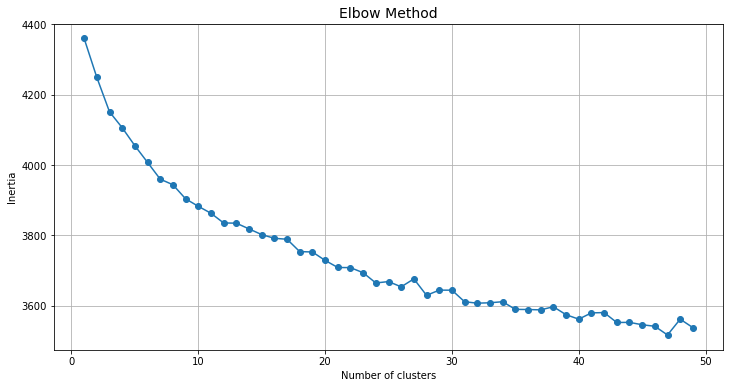

In [43]:
plt.figure(figsize = (12,6))

plt.plot(k_range, cluster_errors, marker = "o", markersize = 6)
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method", fontsize = 14)
plt.grid()

plt.show()

As can be seen from the above graph the elbow method, does not seem to have a clear elbow point and it is rather ambigious. However, this a very common situation in real-life applications. We will proceed, trying one more method, called Silhouette analysis.

### Silhouette Analysis

The Silhouette Coefficient is calculated using the _mean intra-cluster distance_ (a) and the _mean nearest-cluster distance_ (b) for each sample. The Silhouette Coefficient for a sample $ i $ is calculated as: $$ s(i) = \frac{b-a}{max(a,b)}  $$ <br>. To clarify, b is the distance between a sample and the nearest cluster that the sample is not part of.


In [44]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

In [45]:
silhouette_coef = []
range_n_clusters = range(2,30) #[2, 3, 4, 5, 6, 10, 12, 15, 20, 25, 30]
i = 0

for n_clusters in range_n_clusters:
    
    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = MiniBatchKMeans(n_clusters=n_clusters, random_state=234523)
    cluster_labels = clusterer.fit_predict(tfidf_matrix)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(tfidf_matrix, cluster_labels)
    silhouette_coef.append(silhouette_avg)

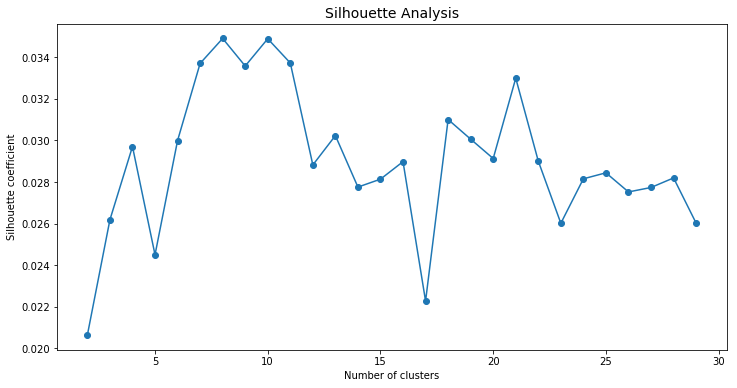

In [46]:
plt.figure(figsize = (12,6))

plt.plot(range_n_clusters, silhouette_coef, marker = "o")
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette coefficient")
plt.title("Silhouette Analysis", fontsize = 14)

plt.show()

In [47]:
optimim_k = silhouette_coef.index(max(silhouette_coef)) + 2
optimim_k

8

# KMeans Clustering

Having defined the optimum number of clusters, we are now ready to proceed to the actual clustering part. As it can be seen below, clustering using MiniBatchKMeans took only 117 ms, while KMeans algorithm required 24.8 sec. That means that the former performed more than 200 times faster!

In [48]:
num_clusters = 8
km = MiniBatchKMeans(n_clusters = num_clusters, random_state = 234523)

% time km.fit(tfidf_matrix)

Wall time: 102 ms


MiniBatchKMeans(batch_size=100, compute_labels=True, init='k-means++',
        init_size=None, max_iter=100, max_no_improvement=10, n_clusters=8,
        n_init=3, random_state=234523, reassignment_ratio=0.01, tol=0.0,
        verbose=0)

In [49]:
# Actual cluster labels
clusters = km.labels_

In [50]:
clusters

array([0, 3, 2, ..., 1, 2, 1])

### Print the most important words for every cluster

In [51]:
km.cluster_centers_.shape

(8, 287)

In [52]:
# For every cluster find the cluster center and print the most frequent words
for i in range(num_clusters):
    
    cluster_center = km.cluster_centers_.argsort()[:,::-1][i][:20]
    
    words = []
    for j in range(cluster_center.shape[0]):
        words.append(voc[cluster_center[j]])
        
    print("Cluster {} \nMost frequent words: \n{}\n\n".format(i, words))

Cluster 0 
Most frequent words: 
['indian', 'powder', 'seed', 'coriand', 'masala', 'ginger', 'garam', 'chop', 'turmer', 'ground', 'leav', 'cumin', 'chilli', 'clove', 'past', 'garlic', 'cardamom', 'onion', 'coconut', 'fresh']


Cluster 1 
Most frequent words: 
['italian', 'chees', 'ounc', 'parmesan', 'mozzarella', 'fresh', 'tomato', 'basil', 'main', 'grate', 'pepper', 'oliv', 'chop', 'dri', 'ricotta', 'slice', 'pasta', 'oil', 'sauc', 'garlic']


Cluster 2 
Most frequent words: 
['fresh', 'ground', 'american', 'salt', 'pepper', 'slice', 'pound', 'ounc', 'chop', 'sweet', 'oliv', 'sour', 'black', 'oil', 'cut', 'bitter', 'inch', 'salti', 'meati', 'vinegar']


Cluster 3 
Most frequent words: 
['sugar', 'vanilla', 'butter', 'egg', 'flour', 'sweet', 'purpos', 'extract', 'chocol', 'cream', 'american', 'larg', 'milk', 'unsalt', 'meati', 'bake', 'salt', 'ounc', 'french', 'powder']


Cluster 4 
Most frequent words: 
['lemon', 'juic', 'fresh', 'american', 'sweet', 'sour', 'sugar', 'slice', 'orang',

# Visualize Clusters

In [53]:
X = X_embedded

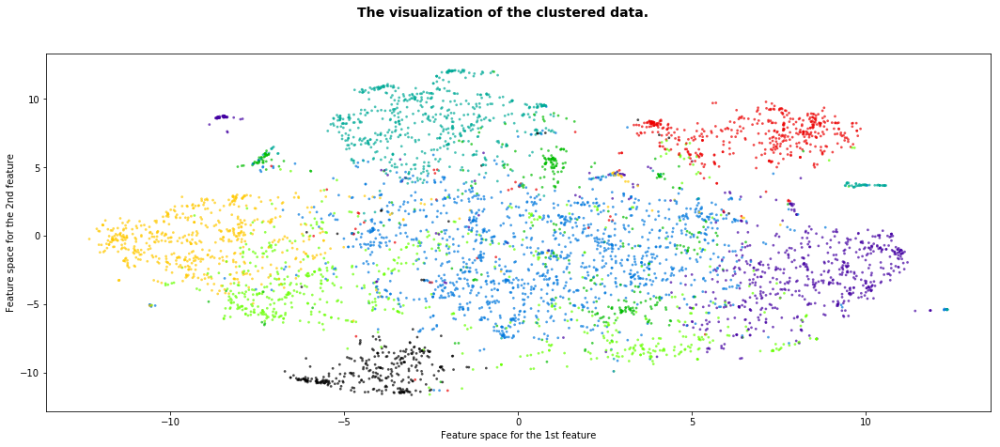

In [54]:
fig, ax2 = plt.subplots()
fig.set_size_inches(18, 7)

colors = cm.spectral(clusters.astype(float) / num_clusters)
ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
            c=colors, edgecolor='k')

# Labeling the clusters
#centers = clusterer.cluster_centers_


# # Draw white circles at cluster centers
# ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
#             c="white", alpha=1, s=200, edgecolor='k')

# for i, c in enumerate(centers):
#     ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
#                 s=50, edgecolor='k')

ax2.set_title("")
ax2.set_xlabel("Feature space for the 1st feature")
ax2.set_ylabel("Feature space for the 2nd feature")


plt.suptitle("The visualization of the clustered data.", fontsize=14, fontweight='bold')

plt.show()

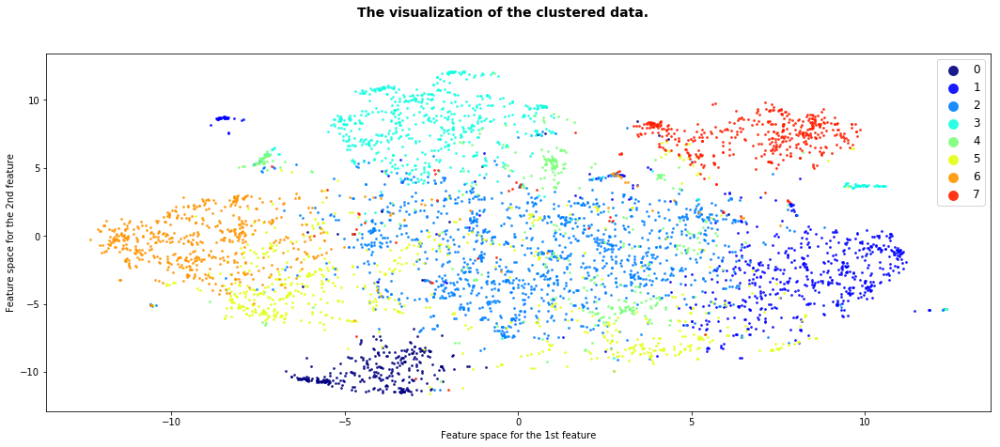

In [55]:
df_plot = pd.DataFrame({'x': X[:,0], 'y': X[:,1], 'cluster': clusters})

fig, ax = plt.subplots()
fig.set_size_inches(18, 7)

cmap = plt.cm.get_cmap('jet')
for i, cluster in df_plot.groupby('cluster'):
    _ = ax.scatter(cluster['x'], cluster['y'], c=cmap(i/num_clusters), label=i, marker='.', s=30, lw=0, alpha=0.9, edgecolor='k')


ax.set_title("")
ax.set_xlabel("Feature space for the 1st feature")
ax.set_ylabel("Feature space for the 2nd feature")
ax.legend(fontsize = 12, markerscale = 4, loc = "best")

plt.suptitle("The visualization of the clustered data.", fontsize=14, fontweight='bold')

plt.show()

## Create a final dataset with recipies, features and clusters

In [56]:
df_final = df2[["Name", "Image_Title", "Course", "Cuisine", "Ingredients", "Flavors", "Features_Combined"]].copy()
feat_list = []

for i in range(df_final.shape[0]):
    
    feat = tfidf_matrix[i,:].toarray()[0]
    ind = [i for i,j in enumerate(feat) if j != 0]
    words = [voc[j] for j in ind]
    feat_list.append(words)

df_final["Features"] = feat_list

df_final["Cluster"] = clusters

In [57]:
df_final.head()

,Name,Image_Title,Course,Cuisine,Ingredients,Flavors,Features_Combined,Features,Cluster
0,Massaman Vegetable Curry With Tofu,img26709.jpg,Main Dishes,Indian,"2 tablespoons coconut oil or organic canola oil¼ teaspoon turmeric1 tablespoon cumin seeds1 large onion, sliced5 garlic cloves, minced2-inch knob ginger, peeled and grated/minced½ teaspoon ground cinnamon½ teaspoon ground cardamom¼ teaspoon ground cloves¼-1/2 teaspoon cayenne pepper¾ teaspoon se...","{'Piquant': 0.1667, 'Sour': 0.6667, 'Salty': 0.1667, 'Sweet': 0.1667, 'Bitter': 0.1667, 'Meaty': 0.1667}","Main Indian Sour 2 tablespoons coconut oil or organic canola oil¼ teaspoon turmeric1 tablespoon cumin seeds1 large onion, sliced5 garlic cloves, minced2-inch knob ginger, peeled and grated/minced½ teaspoon ground cinnamon½ teaspoon ground cardamom¼ teaspoon ground cloves¼-1/2 teaspoon cayenne pe...","[bake, bell, butter, canola, cardamom, carrot, cayenn, cinnamon, clove, coconut, cube, cumin, drain, extra, firm, garlic, ginger, grate, ground, inch, indian, larg, main, medium, milk, minc, oil, onion, ounc, packag, peanut, peel, pepper, plus, potato, red, salt, sea, see, seed, slice, sour, sug...",0
1,Chocolate Thumbprints,img10673.jpg,Lunch and Snacks,American,"10 tablespoons (1¼ sticks) unsalted butter, divided½ cup confectioners' sugar¼ teaspoon salt1 teaspoon vanilla extract1¼ cups all-purpose flour2 ounces semisweet chocolate, finely chopped¾ teaspoon corn syrup","{'Sweet': 0.8333, 'Sour': 0.5, 'Salty': 0.3333, 'Piquant': 0.0, 'Bitter': 0.8333, 'Meaty': 0.5}","American Sweet, Sour, Bitter, Meaty 10 tablespoons (1¼ sticks) unsalted butter, divided½ cup confectioners' sugar¼ teaspoon salt1 teaspoon vanilla extract1¼ cups all-purpose flour2 ounces semisweet chocolate, finely chopped¾ teaspoon corn syrup","[american, bitter, butter, chocol, chop, corn, divid, extract, fine, flour, meati, ounc, purpos, salt, sour, stick, sugar, sweet, unsalt, vanilla]",3
2,Bandito Baked Beans,img21737.jpg,Side Dishes,American,"1 tablespoon vegetable oil1 medium onion, chopped1 cup Pace® Picante Sauce1/4 cup molasses1 tablespoon spicy brown mustard1 (15 ounce) can pork and beans1 (15 ounce) can black beans, rinsed and drained","{'Sweet': 0.8333, 'Sour': 0.3333, 'Salty': 0.1667, 'Piquant': 0.0, 'Bitter': 1.0, 'Meaty': 0.6667}","Side American Sweet, Bitter, Meaty 1 tablespoon vegetable oil1 medium onion, chopped1 cup Pace® Picante Sauce1/4 cup molasses1 tablespoon spicy brown mustard1 (15 ounce) can pork and beans1 (15 ounce) can black beans, rinsed and drained","[american, bean, bitter, black, brown, chop, drain, meati, medium, mustard, oil, onion, ounc, pork, rins, sauc, side, sweet, veget]",2
3,Smoked Trout Salad,img25252.jpg,Salads,American,"1 pound smoked trout, skin removed2 tablespoons chopped fresh chives1 shallot, diced (about 3 tablespoons)1/3 cup mayonnaise2 teaspoons fresh lemon juiceSalt, to tasteFreshly ground pepper, to taste","{'Sweet': 0.3333, 'Sour': 0.3333, 'Salty': 0.5, 'Piquant': 0.0, 'Bitter': 0.1667, 'Meaty': 0.1667}","American Salty 1 pound smoked trout, skin removed2 tablespoons chopped fresh chives1 shallot, diced (about 3 tablespoons)1/3 cup mayonnaise2 teaspoons fresh lemon juiceSalt, to tasteFreshly ground pepper, to taste","[american, chive, chop, dice, fresh, ground, lemon, mayonnais, pepper, pound, remov, salti, shallot, skin, smoke, tast]",4
4,New England Molasses Gingerbread Cookies,img12343.jpg,Desserts,American,"6 cups (about) all purpose flour1 tablespoon ground cinnamon2 teaspoons ground ginger1 1/2 teaspoons ground cloves3/4 teaspoon salt11 tablespoons (1 stick plus 3 tablespoons) unsalted butter, room temperature2/3 cup solid vegetable shortening1 cup sugar1 cup mild-flavored (light) molasses1 1/2 t...","{'Sweet': 1.0, 'Sour': 0.8333, 'Salty': 0.3333, 'Piquant': 0.0, 'Bitter': 0.6667, 'Meaty': 0.6667}","American Sweet, Sour, Bitter, Meaty 6 cups (about) all purpose flour1 tablespoon ground cinnamon2 teaspoons ground ginger1 1/2 teaspoons ground cloves3/

In [58]:
# Export DataFrame to excel
# writer = pd.ExcelWriter("FinalDataframe_.xlsx")
# df_final.to_excel(writer, "Sheet 1", index = False)
# writer.save()

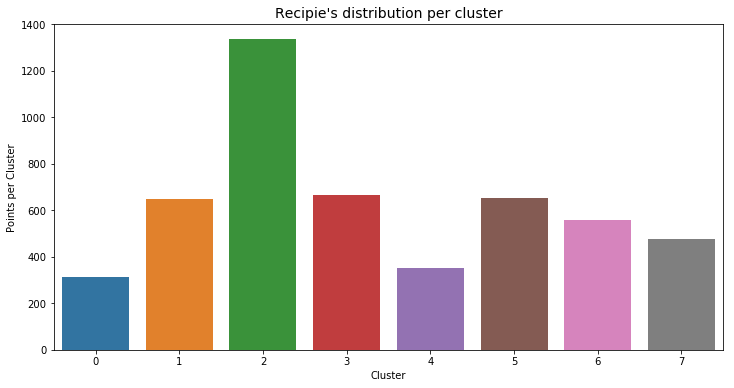

In [59]:
plt.figure(figsize = (12,6))

sns.countplot(x = "Cluster", data = df_final)
plt.xlabel("Cluster")
plt.ylabel("Points per Cluster")
plt.title("Recipie's distribution per cluster", fontsize = 14)

plt.show()

In [60]:
df_final.head()

,Name,Image_Title,Course,Cuisine,Ingredients,Flavors,Features_Combined,Features,Cluster
0,Massaman Vegetable Curry With Tofu,img26709.jpg,Main Dishes,Indian,"2 tablespoons coconut oil or organic canola oil¼ teaspoon turmeric1 tablespoon cumin seeds1 large onion, sliced5 garlic cloves, minced2-inch knob ginger, peeled and grated/minced½ teaspoon ground cinnamon½ teaspoon ground cardamom¼ teaspoon ground cloves¼-1/2 teaspoon cayenne pepper¾ teaspoon se...","{'Piquant': 0.1667, 'Sour': 0.6667, 'Salty': 0.1667, 'Sweet': 0.1667, 'Bitter': 0.1667, 'Meaty': 0.1667}","Main Indian Sour 2 tablespoons coconut oil or organic canola oil¼ teaspoon turmeric1 tablespoon cumin seeds1 large onion, sliced5 garlic cloves, minced2-inch knob ginger, peeled and grated/minced½ teaspoon ground cinnamon½ teaspoon ground cardamom¼ teaspoon ground cloves¼-1/2 teaspoon cayenne pe...","[bake, bell, butter, canola, cardamom, carrot, cayenn, cinnamon, clove, coconut, cube, cumin, drain, extra, firm, garlic, ginger, grate, ground, inch, indian, larg, main, medium, milk, minc, oil, onion, ounc, packag, peanut, peel, pepper, plus, potato, red, salt, sea, see, seed, slice, sour, sug...",0
1,Chocolate Thumbprints,img10673.jpg,Lunch and Snacks,American,"10 tablespoons (1¼ sticks) unsalted butter, divided½ cup confectioners' sugar¼ teaspoon salt1 teaspoon vanilla extract1¼ cups all-purpose flour2 ounces semisweet chocolate, finely chopped¾ teaspoon corn syrup","{'Sweet': 0.8333, 'Sour': 0.5, 'Salty': 0.3333, 'Piquant': 0.0, 'Bitter': 0.8333, 'Meaty': 0.5}","American Sweet, Sour, Bitter, Meaty 10 tablespoons (1¼ sticks) unsalted butter, divided½ cup confectioners' sugar¼ teaspoon salt1 teaspoon vanilla extract1¼ cups all-purpose flour2 ounces semisweet chocolate, finely chopped¾ teaspoon corn syrup","[american, bitter, butter, chocol, chop, corn, divid, extract, fine, flour, meati, ounc, purpos, salt, sour, stick, sugar, sweet, unsalt, vanilla]",3
2,Bandito Baked Beans,img21737.jpg,Side Dishes,American,"1 tablespoon vegetable oil1 medium onion, chopped1 cup Pace® Picante Sauce1/4 cup molasses1 tablespoon spicy brown mustard1 (15 ounce) can pork and beans1 (15 ounce) can black beans, rinsed and drained","{'Sweet': 0.8333, 'Sour': 0.3333, 'Salty': 0.1667, 'Piquant': 0.0, 'Bitter': 1.0, 'Meaty': 0.6667}","Side American Sweet, Bitter, Meaty 1 tablespoon vegetable oil1 medium onion, chopped1 cup Pace® Picante Sauce1/4 cup molasses1 tablespoon spicy brown mustard1 (15 ounce) can pork and beans1 (15 ounce) can black beans, rinsed and drained","[american, bean, bitter, black, brown, chop, drain, meati, medium, mustard, oil, onion, ounc, pork, rins, sauc, side, sweet, veget]",2
3,Smoked Trout Salad,img25252.jpg,Salads,American,"1 pound smoked trout, skin removed2 tablespoons chopped fresh chives1 shallot, diced (about 3 tablespoons)1/3 cup mayonnaise2 teaspoons fresh lemon juiceSalt, to tasteFreshly ground pepper, to taste","{'Sweet': 0.3333, 'Sour': 0.3333, 'Salty': 0.5, 'Piquant': 0.0, 'Bitter': 0.1667, 'Meaty': 0.1667}","American Salty 1 pound smoked trout, skin removed2 tablespoons chopped fresh chives1 shallot, diced (about 3 tablespoons)1/3 cup mayonnaise2 teaspoons fresh lemon juiceSalt, to tasteFreshly ground pepper, to taste","[american, chive, chop, dice, fresh, ground, lemon, mayonnais, pepper, pound, remov, salti, shallot, skin, smoke, tast]",4
4,New England Molasses Gingerbread Cookies,img12343.jpg,Desserts,American,"6 cups (about) all purpose flour1 tablespoon ground cinnamon2 teaspoons ground ginger1 1/2 teaspoons ground cloves3/4 teaspoon salt11 tablespoons (1 stick plus 3 tablespoons) unsalted butter, room temperature2/3 cup solid vegetable shortening1 cup sugar1 cup mild-flavored (light) molasses1 1/2 t...","{'Sweet': 1.0, 'Sour': 0.8333, 'Salty': 0.3333, 'Piquant': 0.0, 'Bitter': 0.6667, 'Meaty': 0.6667}","American Sweet, Sour, Bitter, Meaty 6 cups (about) all purpose flour1 tablespoon ground cinnamon2 teaspoons ground ginger1 1/2 teaspoons ground cloves3/

## Plot pictures per cluster

In [61]:
df_final["Cluster"].value_counts()

2    1335
3     667
5     651
1     650
6     558
7     475
4     353
0     311
Name: Cluster, dtype: int64

In [62]:
import matplotlib.image as mpimg

#config.Spawner.args = ['--NotebookApp.iopub_data_rate_limit=1000000000']
%matplotlib inline

pic = df_final.loc[df_final["Cluster"] == 0][:25]

In [63]:
def ShowClusterPictures(df, cluster, recipe_number):
    
    '''
    For every cluster show some recipes along with their images
    
    recipe_number: Must be a perfect square (i.e. 9, 16, 25 etc)
    '''
    
    # Locate the recipes for the specific cluster
    pic = df.loc[df["Cluster"] == cluster][:recipe_number]
    
    # Initialize figure
    plt.figure(figsize = (18,16))
    j = 1
    
    # Iterate through all images 
    for i in pic.index.tolist():

        img_name = "\\" + pic["Image_Title"][i]
        path = img_filepath + img_name
        img = mpimg.imread(path)
        
        plt.subplot(5,5,j)
        plt.imshow(img)
        a1 = pic["Name"][i][:round(len(pic["Name"][i])/2)] ## Split title to two lines, because some of them are really long
        a2 = pic["Name"][i][round(len(pic["Name"][i])/2)+1:]
        plt.title(a1 + "\n" + a2)
        plt.xlabel("")
        plt.ylabel("")
        j = j+1
        
    plt.suptitle("Cluster {}".format(cluster), fontsize = 14)

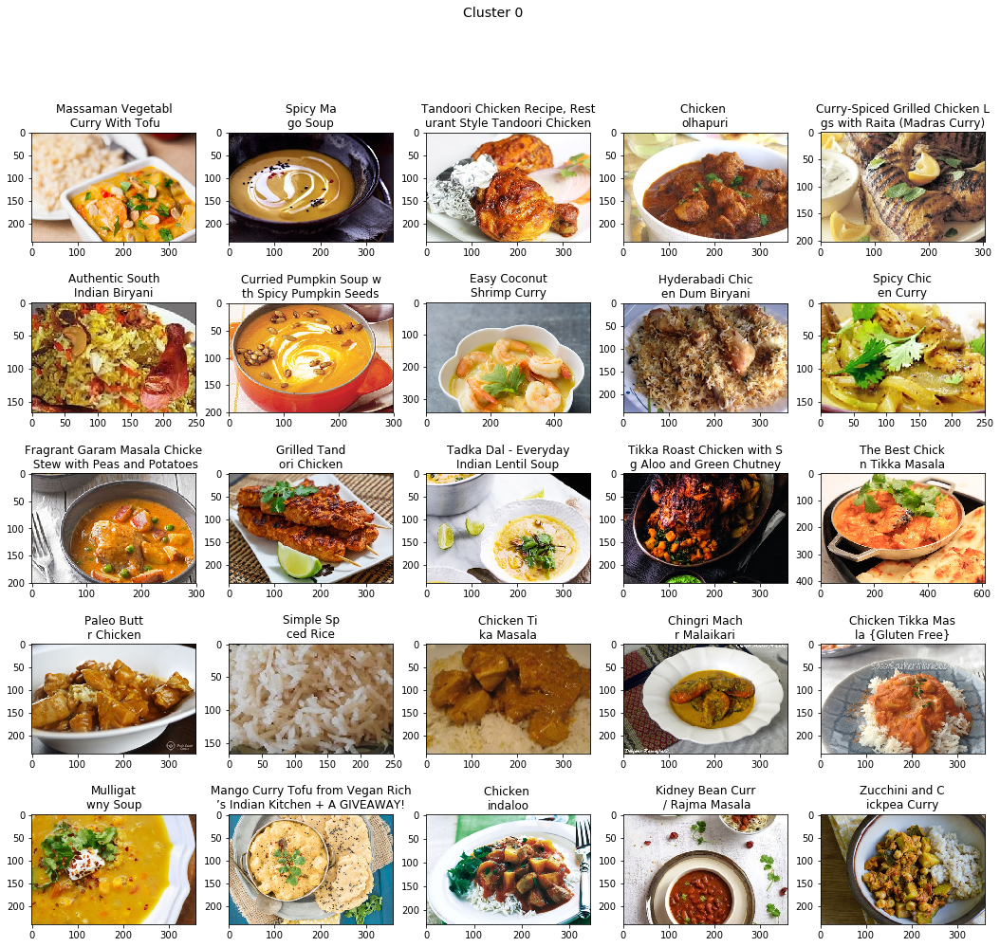

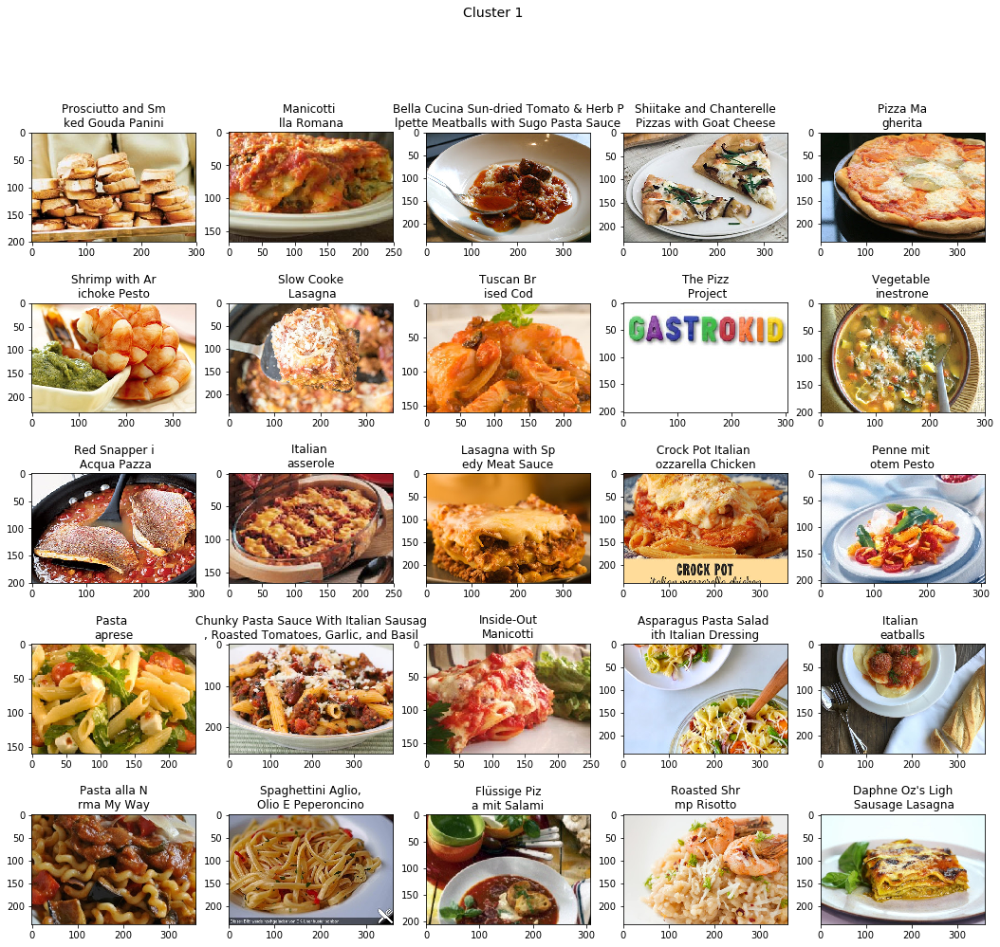

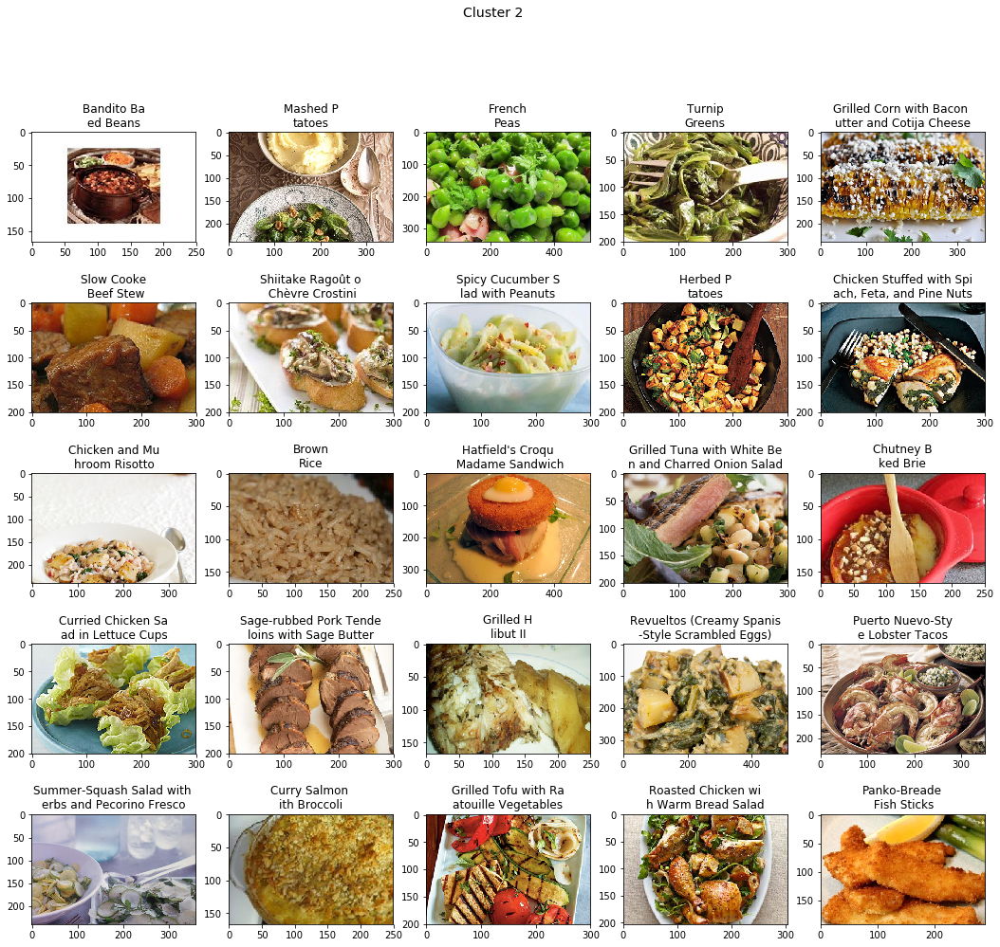

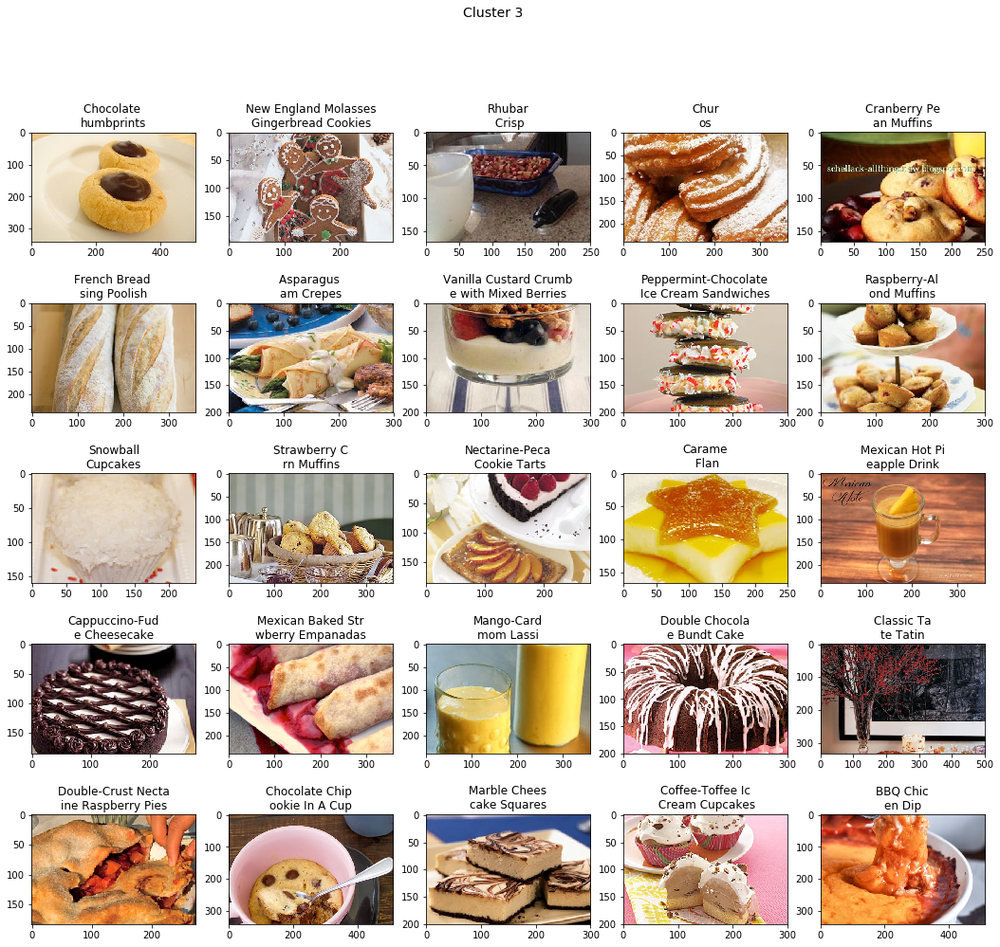

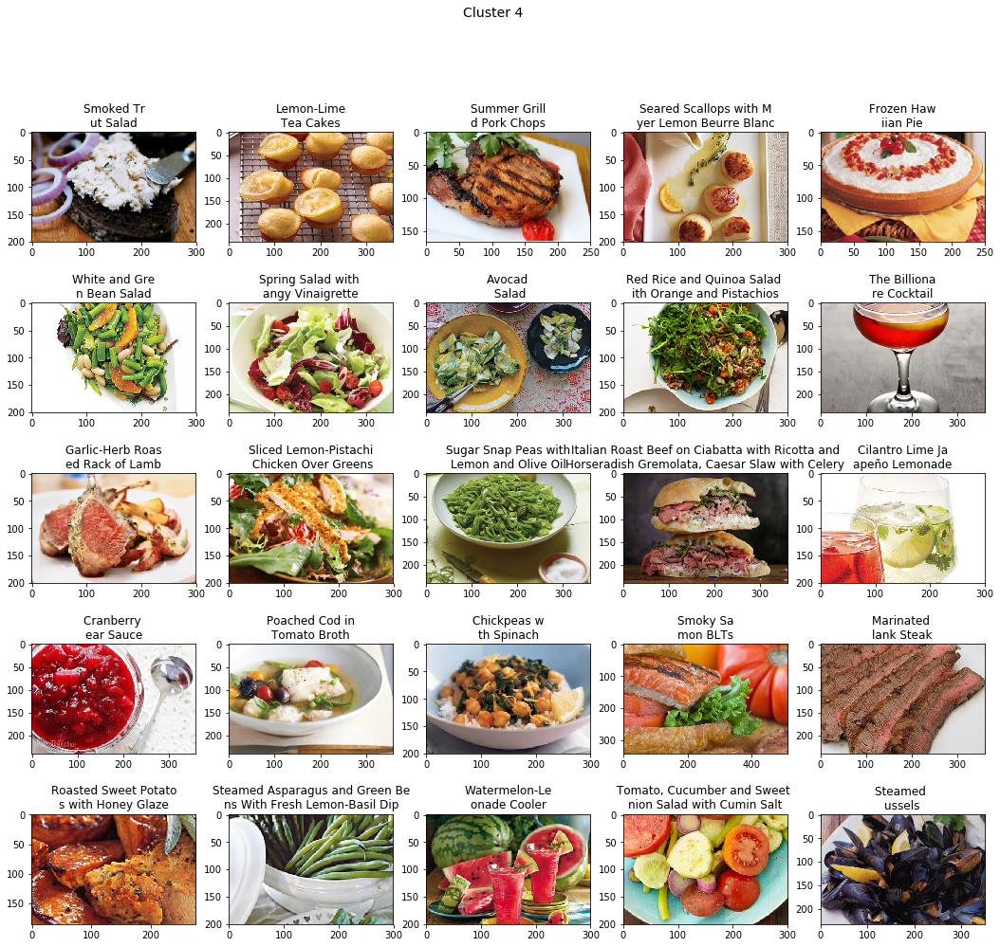

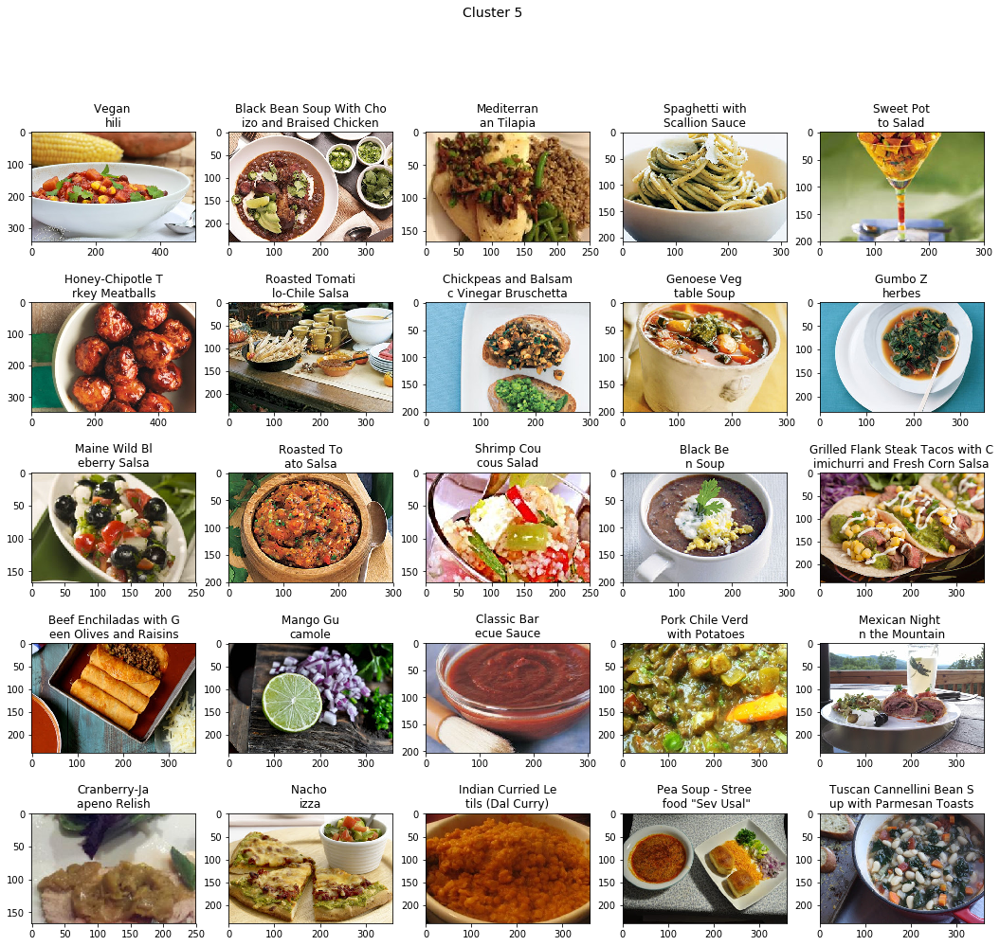

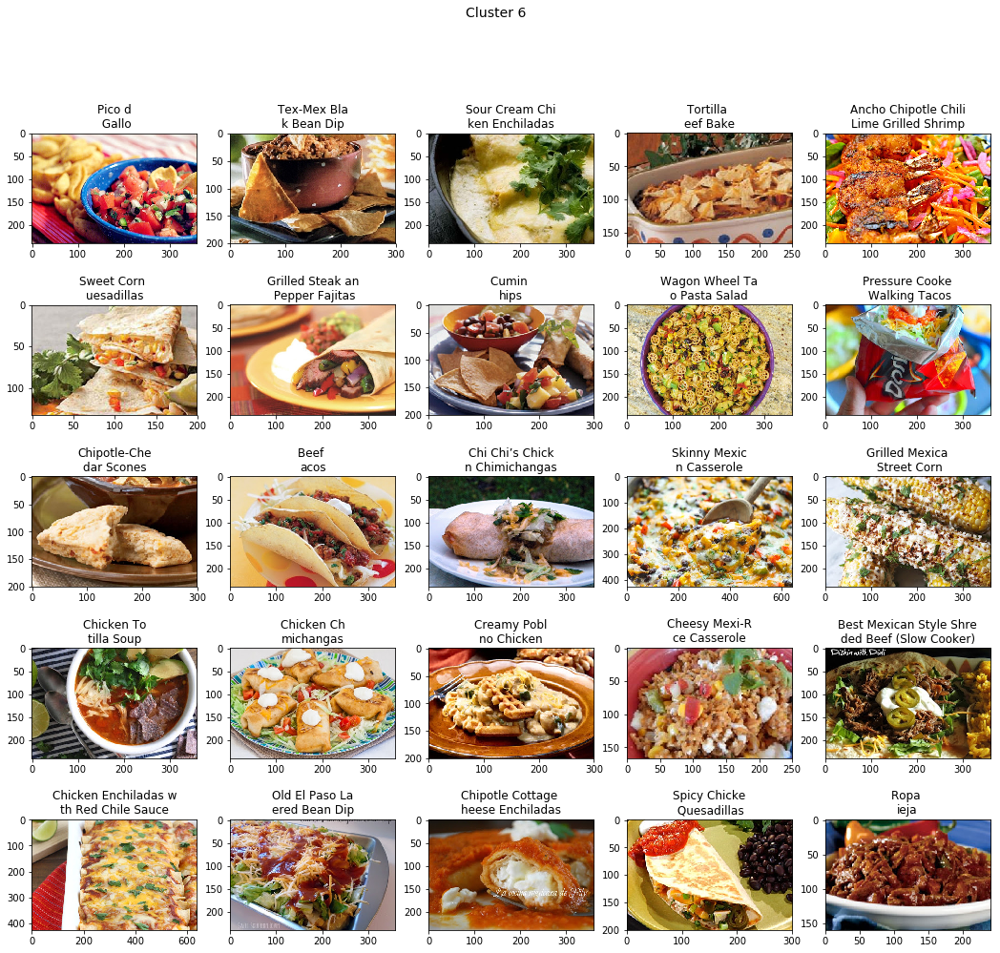

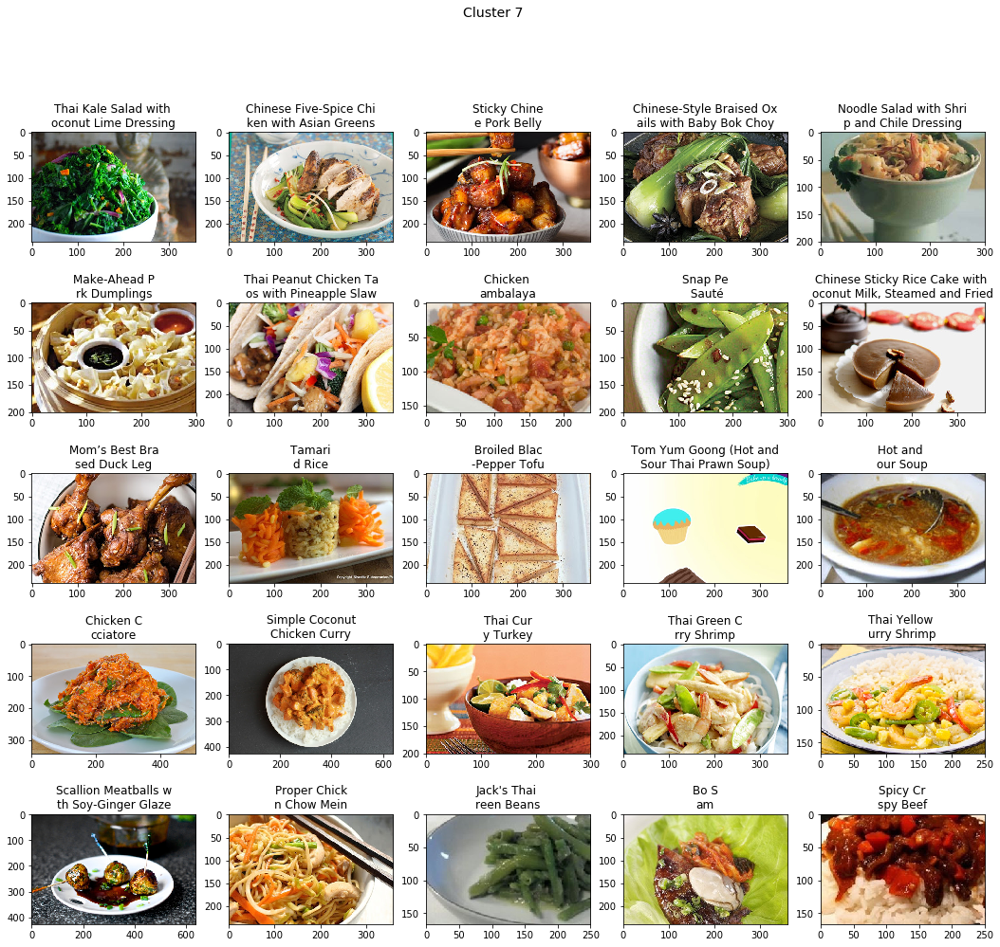

In [64]:
for clust in np.unique(df_final["Cluster"]):
    
    ShowClusterPictures(df_final, clust, 25)